In [ ]:
!pip install noisereduce

  Created wheel for noisereduce: filename=noisereduce-1.1.0-cp36-none-any.whl size=7608 sha256=2cc31596875dc7b883fb0702f9464c43838e3d3c7b667ea7fac7d50474cef49c
  Stored in directory: /root/.cache/pip/wheels/a6/2c/70/f9ccb41280dcfbe3eaeb7930f913dd85394617f3d3136f29cc
Successfully built noisereduce


In [ ]:
from scipy.io import wavfile
from matplotlib import pyplot as plt
import numpy as np

# Load the data and calculate the time of each sample
samplerate, data = wavfile.read('/content/drive/My Drive/audio_atributes/canonrock_music.wav')

In [ ]:
IPython.display.Audio(rate=samplerate,data=data)

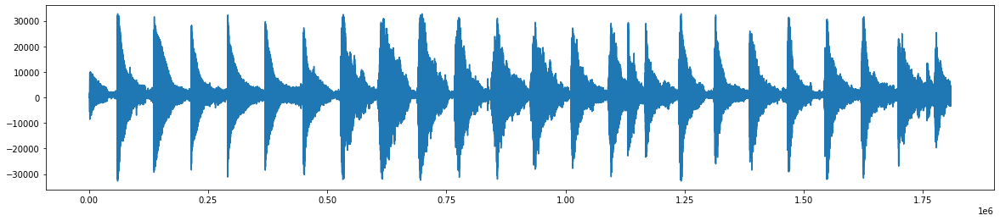

In [ ]:
fig, ax = plt.subplots(figsize=(20,4))
ax.plot(data)

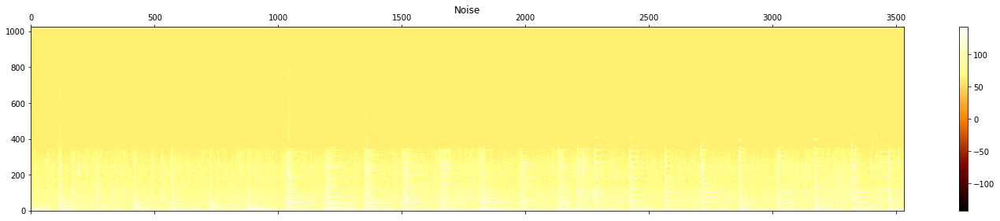

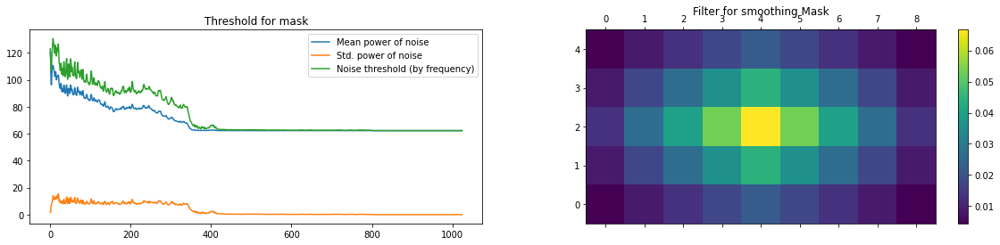

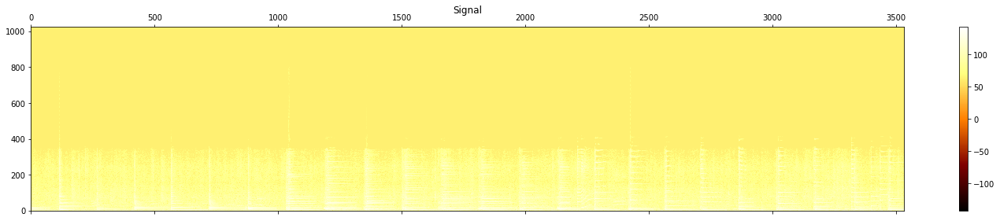

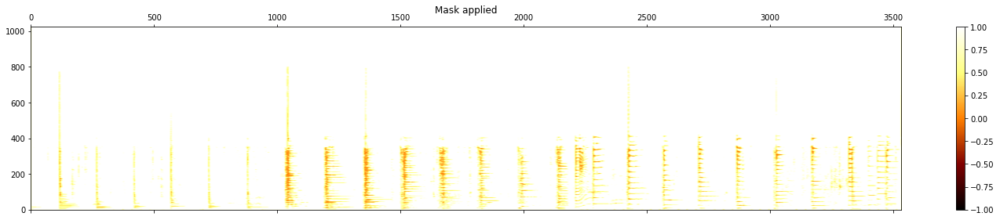

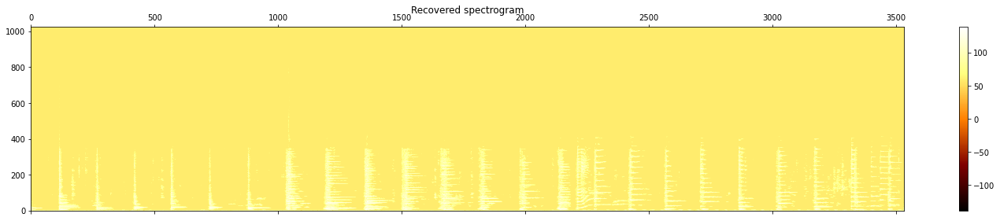

In [ ]:
import noisereduce as nr
# load data
# select section of data that is noise
data=data/1.0
noisy_part = data

# perform noise reduction
reduced_noise = nr.reduce_noise(audio_clip=data, noise_clip=noisy_part, verbose=True)

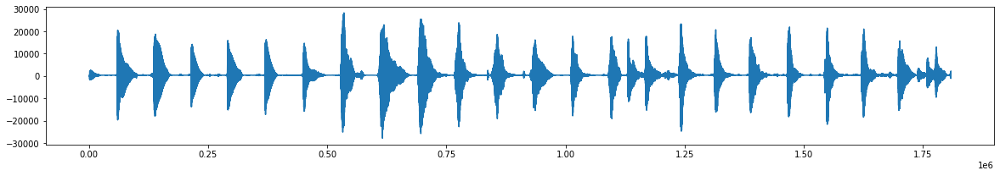

In [ ]:
fig, ax = plt.subplots(figsize=(20,3))
ax.plot(reduced_noise)

In [ ]:
IPython.display.Audio(rate=samplerate, data= reduced_noise)

In [ ]:
!pip install aubio

     |████████████████████████████████| 481kB 2.9MB/s 
  Created wheel for aubio: filename=aubio-0.4.9-cp36-cp36m-linux_x86_64.whl size=386244 sha256=f6bfa8d2fae20c32dc02e29875ab54d92049030a803aea2081e16a4477b521d0
  Stored in directory: /root/.cache/pip/wheels/ac/93/da/33a0041dff56d6c1faf82c83ff487cf669442b7087db20a995
Successfully built aubio


[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
///
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


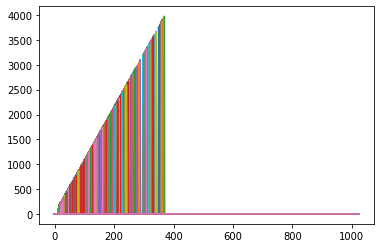

In [ ]:
import numpy as np 
import matplotlib.pyplot as plt 

import librosa as lr


audio='drive/My Drive/audio_atributes/canonrock_music'

y, sr = lr.load('./{}.wav'.format(audio))
pitches, magnitudes = lr.piptrack(y=y, sr=sr)
print(pitches)
print('///')
print(magnitudes)
plt.plot(pitches)
plt.show()


/usr/local/lib/python3.6/dist-packages/librosa/beat.py:306: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
  hop_length=hop_length))
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
  """


[135.99917763]


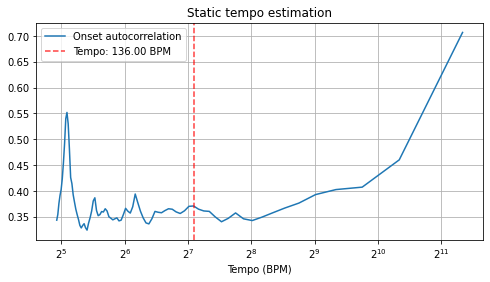

In [ ]:
onset_env = lr.onset.onset_strength(y, sr=sr)
tempo = lr.beat.tempo(onset_envelope=onset_env, sr=sr)
print(tempo)
tempo = np.asscalar(tempo)
# Compute 2-second windowed autocorrelation
hop_length = 512
ac = lr.autocorrelate(onset_env, 2 * sr // hop_length)
freqs = lr.tempo_frequencies(len(ac), sr=sr,hop_length=hop_length)
# Plot on a BPM axis.  We skip the first (0-lag) bin.
plt.figure(figsize=(8,4))
plt.semilogx(freqs[1:], lr.util.normalize(ac)[1:],label='Onset autocorrelation', basex=2)
plt.axvline(tempo, 0, 1, color='r', alpha=0.75, linestyle='--',label='Tempo: {:.2f} BPM'.format(tempo))
plt.xlabel('Tempo (BPM)')
plt.grid()
plt.title('Static tempo estimation')
plt.legend(frameon=True)
plt.axis('tight')
plt.show()

In [ ]:
#Imports

## General Imports
import numpy as np

## Visualization
import seaborn
import matplotlib.pyplot as plt
import IPython.display as ipd
from ipywidgets import interactive_output #http://ipywidgets.readthedocs.io/en/latest/index.html
from ipywidgets import IntSlider, FloatSlider, fixed, Checkbox
from ipywidgets import VBox, Label


## Audio Imports
import librosa, librosa.display           #https://librosa.github.io/librosa/index.html
from midiutil import MIDIFile             #http://midiutil.readthedocs.io/en/1.2.1/
from music21.tempo import MetronomeMark   #http://web.mit.edu/music21/
from music21.note import Note, Rest
from music21.stream import Stream
from music21 import metadata
from music21 import instrument
from music21 import midi 
from music21.key import Key

In [ ]:
pip install MIDIUtil

     |████████████████████████████████| 1.0MB 4.6MB/s 
  Created wheel for MIDIUtil: filename=MIDIUtil-1.2.1-cp36-none-any.whl size=54570 sha256=46041ede8360fc13d4eb9fcfc78ac48ac5be18fe63c30bdabefceecc7d6d0d27
  Stored in directory: /root/.cache/pip/wheels/70/f1/24/97bde012f64820632e1e5e2935df19dfbcf9e058b0734b57cd
Successfully built MIDIUtil


In [ ]:

# Configurations

## Path
path = '/content/drive/My Drive/audio_atributes'

#%matplotlib notebook

## Matplotlib
plt.rc("figure", figsize=(16, 8))

In [ ]:
# Parameters
## Signal Processing 
fs = 44100                               # Sampling Frequency
nfft = 2048                              # length of the FFT window
overlap = 0.5                            # Hop overlap percentage
hop_length = int(nfft*(1-overlap))       # Number of samples between successive frames
n_bins = 72                              # Number of frequency bins
mag_exp = 4                              # Magnitude Exponent
pre_post_max = 6                         # Pre- and post- samples for peak picking
cqt_threshold = -61    

In [ ]:
# Loadinging audio file
filename = '%s/Guns N Roses-Sweet Child O Mine Intro.wav'%path
x, fs = librosa.load(filename, sr=None, mono=True, duration=12)
# Audio data information
print("x Shape=", x.shape)
print("Sample rate fs=", fs)
print("Audio Length in seconds=%d [s]" % (x.shape[0]/fs))
# Playback audio file
ipd.Audio(x, rate=fs)

x Shape= (529200,)
Sample rate fs= 44100
Audio Length in seconds=12 [s]


In [ ]:
# CQT vs FFT

# CQT Frequencies
cqt_freqs = librosa.core.cqt_frequencies(n_bins=128, fmin=librosa.note_to_hz('C0'), bins_per_octave=12)

# FFT Frequencies
fft_freqs = librosa.fft_frequencies(sr=44100, n_fft=128)

# Notes Center Frequencies
notes_freqs = 440*2**(np.arange(-57, (128-57))/12)

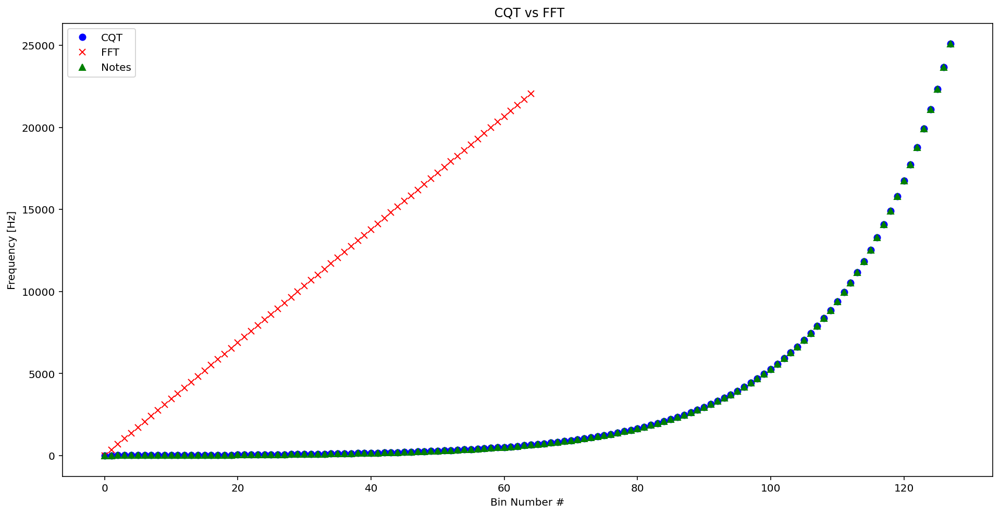

In [ ]:
# Plot CQT vs FFT
plt.figure()
plt.plot(cqt_freqs, 'bo', label='CQT')
plt.plot(fft_freqs, 'rx', label= 'FFT')
plt.plot(notes_freqs, 'g^', label = 'Notes')
plt.title(" CQT vs FFT")
plt.xlabel('Bin Number #')
plt.ylabel('Frequency [Hz]')
plt.legend();

In [ ]:

# CQT
## Function
def calc_cqt(x,fs=fs,hop_length=hop_length, n_bins=n_bins, mag_exp=mag_exp):
    C = librosa.cqt(x, sr=fs, hop_length=hop_length, fmin=None, n_bins=n_bins)
    C_mag = librosa.magphase(C)[0]**mag_exp
    CdB = librosa.core.amplitude_to_db(C_mag ,ref=np.max)
    return CdB

In [ ]:

# CQT Threshold
def cqt_thresholded(cqt,thres=cqt_threshold):
    new_cqt=np.copy(cqt)
    new_cqt[new_cqt<thres]=-120
    return new_cqt

In [ ]:
# Onset Envelope from Cqt
def calc_onset_env(cqt):
    return librosa.onset.onset_strength(S=cqt, sr=fs, aggregate=np.mean, hop_length=hop_length)

In [ ]:
# Onset from Onset Envelope
def calc_onset(cqt, pre_post_max=pre_post_max, backtrack=True):
    onset_env=calc_onset_env(cqt)
    onset_frames = librosa.onset.onset_detect(onset_envelope=onset_env,
                                           sr=fs, units='frames', 
                                           hop_length=hop_length, 
                                           backtrack=backtrack,
                                           pre_max=pre_post_max,
                                           post_max=pre_post_max)
    onset_boundaries = np.concatenate([[0], onset_frames, [cqt.shape[1]]])
    onset_times = librosa.frames_to_time(onset_boundaries, sr=fs, hop_length=hop_length)
    return [onset_times, onset_boundaries, onset_env]


In [ ]:
# Fine Tuning UI
style = {'description_width': 'initial'}
mag_exp_slider=IntSlider(value=mag_exp, min=1, max=32, step=1, 
                         description='mag_exp:',continuous_update=False)

thres_slider=IntSlider(value=cqt_threshold, min=-120, max=0, step=1, 
                                                     description='Threshold:',continuous_update=False)

pre_post_slider=IntSlider(value=pre_post_max, min=1, max=32, step=1, 
                         description='Pre_post_max:',continuous_update=False, style=style)

backtrack_box=Checkbox(value=False,description='backtrack',disabled=False)


def inter_cqt_tuning(mag_exp,thres,pre_post_max, backtrack):
    thres=thres_slider.value
    mag_exp=mag_exp_slider.value
    pre_post_max=pre_post_slider.value
    backtrack=backtrack_box.value
    global CdB
    CdB = calc_cqt(x,fs,hop_length, n_bins, mag_exp)
    plt.figure()
    new_cqt=cqt_thresholded(CdB,thres)
    librosa.display.specshow(new_cqt, sr=fs, hop_length=hop_length, x_axis='time', y_axis='cqt_note', cmap='coolwarm')
    plt.ylim([librosa.note_to_hz('B2'),librosa.note_to_hz('B6')])
    global onsets
    onsets=calc_onset(new_cqt,pre_post_max, backtrack)
    plt.vlines(onsets[0], 0, fs/2, color='k', alpha=0.8)
    plt.title("CQT - Sweet Child O' Mine Intro")
    plt.colorbar()
    plt.show()

In [ ]:
# Display UI
out = interactive_output(inter_cqt_tuning,  {'mag_exp': mag_exp_slider, 'thres': thres_slider, 
                                             'pre_post_max': pre_post_slider, 'backtrack':backtrack_box})
ui = VBox([mag_exp_slider, thres_slider, pre_post_slider, backtrack_box])
display(ui, out)

Output()

In [ ]:
# Estimate Tempo
tempo, beats=librosa.beat.beat_track(y=None, sr=fs, onset_envelope=onsets[2], hop_length=hop_length,
               start_bpm=120.0, tightness=100, trim=True, bpm=None,
               units='frames')
tempo=int(2*round(tempo/2))
mm = MetronomeMark(referent='quarter', number=tempo)

/usr/local/lib/python3.6/dist-packages/librosa/beat.py:306: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
  hop_length=hop_length))


In [ ]:
# Convert Seconds to Quarter-Notes
def time_to_beat(duration, tempo):
    return (tempo*duration/60)

In [ ]:
def remap(x,in_min,in_max,out_min,out_max):
  return (x-in_min)*(out_max-out_min)/(in_max-in_min)+out_min

In [ ]:
# Generate Sinewave, MIDI Notes and music21 notes
def generate_sine_midi_note(f0_info, sr, n_duration, round_to_sixtenth=True):
    f0=f0_info[0]
    A=remap(f0_info[1], CdB.min(), CdB.max(), 0, 1)
    duration = librosa.frames_to_time(n_duration, sr=fs, hop_length=hop_length)
    #Generate Midi Note and music21 note
    note_duration = 0.02*np.around(duration/2/0.02) # Round to 2 decimal places for music21 compatibility
    midi_duration = time_to_beat(duration, tempo)
    midi_velocity=int(round(remap(f0_info[1], CdB.min(), CdB.max(), 0, 127)))
    if round_to_sixtenth:
        midi_duration=round(midi_duration*16)/16
    if f0==None:
        midi_note=None
        note_info=Rest(type=mm.secondsToDuration(note_duration).type)
        f0=0
    else:
        midi_note=round(librosa.hz_to_midi(f0))
        note = Note(librosa.midi_to_note(midi_note), type=mm.secondsToDuration(note_duration).type)
        note.volume.velocity = midi_velocity
        note_info = [note]
    midi_info = [midi_note, midi_duration, midi_velocity]
            
    # Generate Sinewave
    n = np.arange(librosa.frames_to_samples(n_duration, hop_length=hop_length ))
    sine_wave = A*np.sin(2*np.pi*f0*n/float(sr))
    return [sine_wave, midi_info, note_info]

In [ ]:
#Estimate Pitch
def estimate_pitch(segment, threshold):
    freqs = librosa.cqt_frequencies(n_bins=n_bins, fmin=librosa.note_to_hz('C1'),
                            bins_per_octave=12)
    if segment.max()<threshold:
        return [None, np.mean((np.amax(segment,axis=0)))]
    else:
        f0 = int(np.mean((np.argmax(segment,axis=0))))
    return [freqs[f0], np.mean((np.amax(segment,axis=0)))]

In [ ]:
def estimate_pitch_and_notes(x, onset_boundaries, i, sr):
    n0 = onset_boundaries[i]
    n1 = onset_boundaries[i+1]
    f0_info = estimate_pitch(np.mean(x[:,n0:n1],axis=1),threshold=cqt_threshold)
    return generate_sine_midi_note(f0_info, sr, n1-n0)

In [ ]:
pip install music21

In [ ]:
# Array of music information - Sinewave, MIDI Notes and muisc21 Notes
music_info = np.array([
    estimate_pitch_and_notes(CdB, onsets[1], i, sr=fs)
    for i in range(len(onsets[1])-1)
])

TypeError: ignored

In [ ]:
# Get sinewave 
synth_audio=np.concatenate(music_info[:,0])

In [ ]:

# Play generatade sinewave
ipd.Audio(synth_audio, rate=fs)

In [ ]:
# Get muisc21 notes
note_info = list(music_info[:,2])

In [ ]:
# Create music21 stream
s = Stream()
s.append(mm)
electricguitar = instrument.fromString('electric guitar')
electricguitar.midiChannel=0
electricguitar.midiProgram=30  #Set program to Overdriven Guitar
s.append(electricguitar)
s.insert(0, metadata.Metadata())
s.metadata.title = "Sweet Child O' Mine - Introduction"
s.metadata.composer = "Guns n' Roses"
for note in note_info:
    s.append(note)

In [ ]:
# Analyse music21 stream to get song Key
key=s.analyze('key')
print(key.name)
# Insert Key to Stream
s.insert(0, key)

C# major


In [ ]:

# Display music21 stream
# If you have Musescore installed and configured displays music score - https://musescore.org/en
#s.show() # You must have Nusescore installed and Configured to run this and display the music score

# Show stream as text
s.show('text')

{0.0} <music21.metadata.Metadata object at 0x7f019c34b278>
{0.0} <music21.instrument.ElectricGuitar Electric Guitar>
{0.0} <music21.tempo.MetronomeMark allegro moderato Quarter=130>
{0.0} <music21.key.Key of C# major>
{0.0} <music21.note.Rest rest>
{1.0} <music21.note.Note C#>
{1.5} <music21.note.Note C#>
{1.75} <music21.note.Note G#>
{2.25} <music21.note.Note F#>
{2.75} <music21.note.Note F#>
{3.0} <music21.note.Note G#>
{3.5} <music21.note.Note F>
{4.0} <music21.note.Note G#>
{4.5} <music21.note.Note C#>
{5.0} <music21.note.Note C#>
{5.5} <music21.note.Note G#>
{6.0} <music21.note.Note F#>
{6.5} <music21.note.Note F#>
{7.0} <music21.note.Note G#>
{7.5} <music21.note.Note F>
{8.0} <music21.note.Note G#>
{8.25} <music21.note.Note D#>
{8.75} <music21.note.Note C#>
{9.0} <music21.note.Note G#>
{9.5} <music21.note.Note F#>
{10.0} <music21.note.Note F#>
{10.5} <music21.note.Note G#>
{11.0} <music21.note.Note F>
{11.5} <music21.note.Note G#>
{12.0} <music21.note.Note D#>
{12.5} <music21.not

In [ ]:
# Listen to music21 stream as MIDI
s.show('midi') 

# Pygame play - Needs pygame to be installed
#sp = midi.realtime.StreamPlayer(s)
#sp.play()

In [ ]:
# Save MIdi to file
s.write('midi', 'sweet_child_music21.mid')

# Another way for saving midi
#mf = midi.translate.streamToMidiFile(s)
#mf.open('sweet_child_mine'+'.mid', 'wb')
#mf.write()
#mf.close()

'sweet_child_music21.mid'

In [ ]:

# If you have MuseScore installed, opens midi file in it
#! "D:\ProgramFiles\MuseScore2\bin\MuseScore.exe" sweet_child_music21.mid

In [ ]:
# Get MIDI Information
midi_info = list(music_info[:,1])

In [ ]:
# Save midi file from MIDI information using MIDIUtils - not using anything from music21, 
track    = 0
channel  = 0
tempo    = tempo  # In BPM
volume   = 100  # 0-127, as per the MIDI standard

gnr = MIDIFile(1)  # One track, defaults to format 1 (tempo track is created
                      # automatically)
gnr.addTrackName(0,0,"Guns n' Roses - Sweet Child O' Mine - Intro")
program = 30 # Overdriven Guitar
gnr.addProgramChange(track, channel, 0, program)
gnr.addTempo(track, 0, tempo)

note_time=0
for i, note in enumerate(midi_info):
    if note[0]==None:
        note_time+=note[1]
    else:
        note_time+=note[1]
        gnr.addNote(track, channel, note[0].astype('int'), note_time, note[1], note[2])

with open("sweet_child_midiutils.mid", "wb") as output_file:
    gnr.writeFile(output_file)

In [ ]:
#! "D:\ProgramFiles\MuseScore2\bin\MuseScore.exe" sweet_child_midiutils.mid